<a href="https://colab.research.google.com/github/wtolbertiv84/TensorFlow-ANN-Repo/blob/main/scikit_learn_k_means_clustering_for_cnc_machine_data_etl_ml.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# The Google Colab Gemini notebook coding assistant was used to generate some of this code.

In [ ]:
pip install scikit-learn

In [ ]:
pip install ucimlrepo

In [ ]:
pip install pyspark h5py

In [ ]:
import pandas as pd
import h5py
import numpy as np
import plotly as plt
import plotly.figure_factory as ff
import plotly.graph_objects as go
from pyspark.sql import SparkSession
from pyspark.sql.types import StructType, StructField, IntegerType, DoubleType, BooleanType, ByteType
from pyspark.sql import functions as F
from datetime import datetime, timedelta
import pathlib as path
from sklearn.model_selection import KFold

In [ ]:
!git clone https://github.com/boschresearch/CNC_Machining.git

Cloning into 'CNC_Machining'...
remote: Enumerating objects: 1972, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (23/23), done.
remote: Total 1972 (delta 5), reused 5 (delta 5), pack-reused 1944 (from 1)
Receiving objects: 100% (1972/1972), 884.54 MiB | 27.49 MiB/s, done.
Resolving deltas: 100% (65/65), done.
Updating files: 100% (1709/1709), done.


In [ ]:
spark = (
    SparkSession.builder
    .master("local[*]")
    .appName("PySpark_ETL")
    .getOrCreate()
)

print("SparkSession initialized successfully!")

SparkSession initialized successfully!


In [ ]:
path = "/content/CNC_Machining/data/M03/OP02/good/M03_Aug_2019_OP02_003.h5"

with h5py.File(path, "r") as f:
    print("Keys available in the H5 file:", list(f.keys()))
    # The H5 file contains 'vibration_data' instead of 'vibration'.
    vibration = np.array(f["vibration_data"])
    # The 'label' key is not present in this H5 file. Commenting out.
    # label = f["label"][()]

# Display the shape of the loaded vibration data.
print("Shape of vibration data:", vibration.shape)

# The original intent to convert to a Spark DataFrame with 'vibration' and 'label'
# needs adjustment as 'label' is not directly available in this H5 file
# and other parts of the notebook use a different dataset.
# If you intend to use this H5 data, you will need to define how 'label' should be derived.
# For now, removing the Spark DataFrame creation to avoid further errors.
# data = {
#     "vibration": vibration.tolist(),
#     "label": label
# }
# spark_dataframe = spark.createDataFrame([data])
# spark_dataframe.printSchema()
# spark_dataframe.show(truncate = False)

Keys available in the H5 file: ['vibration_data']
Shape of vibration data: (83968, 3)


In [ ]:
# Convert the numpy array to a list of lists, and provide column names.
# Assuming vibration data has 3 components (e.g., x, y, z).
spark_dataframe = spark.createDataFrame(vibration.tolist(), ['vibration_x', 'vibration_y', 'vibration_z'])

spark_dataframe.printSchema()
spark_dataframe.show(truncate = False)

root
 |-- vibration_x: double (nullable = true)
 |-- vibration_y: double (nullable = true)
 |-- vibration_z: double (nullable = true)

+-----------+-----------+-----------+
|vibration_x|vibration_y|vibration_z|
+-----------+-----------+-----------+
|37.0       |19.0       |-1020.0    |
|13.0       |5.0        |-1020.0    |
|31.0       |21.0       |-1013.0    |
|15.0       |25.0       |-1030.0    |
|31.0       |35.0       |-1026.0    |
|37.0       |9.0        |-1011.0    |
|15.0       |23.0       |-1026.0    |
|31.0       |25.0       |-1013.0    |
|19.0       |5.0        |-1018.0    |
|37.0       |25.0       |-1034.0    |
|19.0       |13.0       |-1030.0    |
|31.0       |25.0       |-1018.0    |
|27.0       |17.0       |-1032.0    |
|17.0       |21.0       |-1026.0    |
|33.0       |31.0       |-1007.0    |
|27.0       |7.0        |-1024.0    |
|21.0       |25.0       |-1018.0    |
|21.0       |23.0       |-1009.0    |
|27.0       |25.0       |-1034.0    |
|21.0       |9.0        |-102

In [ ]:
print('Missing values in spark_dataframe:')

# Calculate the sum of null values for each column in the Spark DataFrame
null_counts = spark_dataframe.select([
    F.sum(F.when(F.col(c).isNull(), 1).otherwise(0)).alias(c)
    for c in spark_dataframe.columns
])

# Display the results
null_counts.show()

Missing values in spark_dataframe:
+-----------+-----------+-----------+
|vibration_x|vibration_y|vibration_z|
+-----------+-----------+-----------+
|          0|          0|          0|
+-----------+-----------+-----------+



In [ ]:
print('\nData types of pandas_df_for_ydf columns:')
display(spark_dataframe.dtypes)


Data types of pandas_df_for_ydf columns:


[('vibration_x', 'double'),
 ('vibration_y', 'double'),
 ('vibration_z', 'double')]

In [ ]:
print('\nDescriptive statistics of pandas_df_for_ydf:')
display(spark_dataframe.describe())


Descriptive statistics of pandas_df_for_ydf:


DataFrame[summary: string, vibration_x: string, vibration_y: string, vibration_z: string]

In [ ]:
spark_dataframe.dropDuplicates()


DataFrame[vibration_x: double, vibration_y: double, vibration_z: double]

In [ ]:
print('Spark DataFrame Schema:')
spark_dataframe.printSchema()

print('\nFirst 5 rows of Spark DataFrame:')
spark_dataframe.show(5)

Spark DataFrame Schema:
root
 |-- vibration_x: double (nullable = true)
 |-- vibration_y: double (nullable = true)
 |-- vibration_z: double (nullable = true)


First 5 rows of Spark DataFrame:
+-----------+-----------+-----------+
|vibration_x|vibration_y|vibration_z|
+-----------+-----------+-----------+
|       37.0|       19.0|    -1020.0|
|       13.0|        5.0|    -1020.0|
|       31.0|       21.0|    -1013.0|
|       15.0|       25.0|    -1030.0|
|       31.0|       35.0|    -1026.0|
+-----------+-----------+-----------+
only showing top 5 rows


In [ ]:
spark_dataframe.describe()
spark_dataframe.summary().show()
spark_dataframe.explain()

+-------+------------------+-----------------+------------------+
|summary|       vibration_x|      vibration_y|       vibration_z|
+-------+------------------+-----------------+------------------+
|  count|             83968|            83968|             83968|
|   mean|10.459794207317072|18.37129620807927|-1020.462128429878|
| stddev|492.41188008416225|204.0616935735833| 258.0782163100578|
|    min|           -2752.0|          -2808.0|           -2074.0|
|    25%|            -122.0|            -76.0|           -1122.0|
|    50%|              21.0|             19.0|           -1022.0|
|    75%|             163.0|            113.0|            -927.0|
|    max|            2137.0|           2723.0|             150.0|
+-------+------------------+-----------------+------------------+

== Physical Plan ==
*(1) Scan ExistingRDD[vibration_x#0,vibration_y#1,vibration_z#2]




In [ ]:
corr = spark_dataframe.toPandas().corr().values
labels = spark_dataframe.columns

annot = np.where(np.abs(corr) >= 0.5, np.round(corr, 2), "")

fig = ff.create_annotated_heatmap(
    z=corr,
    x=labels,
    y=labels,
    annotation_text=annot,
    colorscale="RdBu",
    font_colors=["black"],
    showscale=True
)

fig.update_layout(
    width=900,
    height=900,
    margin=dict(l=150, r=150, t=250, b=150),
    title={
        "text": "Correlation Matrix (Strong Correlations Highlighted)",
        "y": 0.98,          # move title higher
        "x": 0.5,           # center title
        "xanchor": "center",
        "yanchor": "top"
    }
)

fig.update_xaxes(tickangle=45, tickfont=dict(size=10))
fig.update_yaxes(tickfont=dict(size=10))

fig.show()


In [ ]:
import plotly.express as px
import pandas as pd

# Convert spark_dataframe to a pandas DataFrame for Plotly visualization
pandas_df_for_tf = spark_dataframe.toPandas()

# 1. Distribution of 'vibration_x' using Plotly
fig = px.histogram(pandas_df_for_tf, x='vibration_x',
                   title='Distribution of Vibration X Component',
                   labels={'vibration_x': 'Vibration X Value', 'count': 'Count'})
fig.update_layout(xaxis_title='Vibration X Value', yaxis_title='Count')
fig.show()

In [ ]:
fig = px.scatter(pandas_df_for_tf, x='vibration_x', y='vibration_y',
                   title='Scatter Plot of Vibration X vs. Vibration Y',
                   labels={'vibration_x': 'Vibration X Component', 'vibration_y': 'Vibration Y Component'},
                   opacity=0.6)
fig.update_layout(xaxis_title='Vibration X Component', yaxis_title='Vibration Y Component')
fig.show()

In [ ]:
import plotly.express as px

# 2. Distribution of 'vibration_y' using Plotly
fig = px.histogram(pandas_df_for_tf, x='vibration_y',
                   title='Distribution of Vibration Y Component',
                   labels={'vibration_y': 'Vibration Y Value', 'count': 'Count'})
fig.update_layout(xaxis_title='Vibration Y Value', yaxis_title='Count')
fig.show()

In [ ]:
import plotly.express as px

# 3. Distribution of 'vibration_z' using Plotly
fig = px.histogram(pandas_df_for_tf, x='vibration_z',
                   title='Distribution of Vibration Z Component',
                   labels={'vibration_z': 'Vibration Z Value', 'count': 'Count'})
fig.update_layout(xaxis_title='Vibration Z Value', yaxis_title='Count')
fig.show()

In [ ]:

# 4. 3D Scatter Plot of Vibration Components (X, Y, Z)
fig = px.scatter_3d(pandas_df_for_tf,
                    x='vibration_x',
                    y='vibration_y',
                    z='vibration_z',
                    title='3D Scatter Plot of Vibration X, Y, and Z Components',
                    labels={'vibration_x': 'Vibration X Component',
                            'vibration_y': 'Vibration Y Component',
                            'vibration_z': 'Vibration Z Component'},
                    opacity=0.6)
fig.update_layout(scene = dict(
                    xaxis_title='Vibration X Component',
                    yaxis_title='Vibration Y Component',
                    zaxis_title='Vibration Z Component'))
fig.show()

In [ ]:
import plotly.express as px
import pandas as pd

# Reshape the DataFrame to a long format for combined violin plot
df_melted = pandas_df_for_tf.melt(value_vars=['vibration_x', 'vibration_y', 'vibration_z'],
                                  var_name='Vibration Component',
                                  value_name='Vibration Value')

# Create a combined violin plot for all three vibration components
fig = px.violin(df_melted, y='Vibration Value', x='Vibration Component',
                box=True, points="outliers", # Show box plot and outliers
                title='Combined Violin Plot of Vibration X, Y, and Z Components',
                labels={'Vibration Value': 'Vibration Value', 'Vibration Component': 'Component'},
                color='Vibration Component') # Color by component for distinction

fig.update_layout(xaxis_title='Vibration Component', yaxis_title='Vibration Value')
fig.show()

In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np

# Convert spark_dataframe to a pandas DataFrame for Plotly visualization
pandas_df_for_tf = spark_dataframe.toPandas()

# Create a 'dominant_vibration_axis' column for the pie chart
# We'll determine which axis (x, y, or z) has the largest absolute vibration value
pandas_df_for_tf['dominant_vibration_axis'] = pandas_df_for_tf[['vibration_x', 'vibration_y', 'vibration_z']].abs().idxmax(axis=1)

# Now, generate the pie chart
fig = px.pie(pandas_df_for_tf, names='dominant_vibration_axis',
             title='Proportion of Dominant Vibration Axes',
             labels={'dominant_vibration_axis': 'Dominant Axis'})

fig.update_traces(textposition='inside', textinfo='percent+label', marker=dict(line=dict(color='#000000', width=1)))
fig.update_layout(showlegend=True)
fig.show()

In [ ]:
print('--- Info on pandas_df_for_tf (Vibration Data) ---')
pandas_df_for_tf.info()

--- Info on pandas_df_for_tf (Vibration Data) ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83968 entries, 0 to 83967
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   vibration_x              83968 non-null  float64
 1   vibration_y              83968 non-null  float64
 2   vibration_z              83968 non-null  float64
 3   dominant_vibration_axis  83968 non-null  object 
dtypes: float64(3), object(1)
memory usage: 2.6+ MB


In [ ]:
print('\n--- Descriptive Statistics for pandas_df_for_tf (Vibration Data) ---')
display(pandas_df_for_tf.describe())


--- Descriptive Statistics for pandas_df_for_tf (Vibration Data) ---


,vibration_x,vibration_y,vibration_z
count,83968.000000,83968.000000,83968.000000
mean,10.459794,18.371296,-1020.462128
std,492.411880,204.061694,258.078216
min,-2752.000000,-2808.000000,-2074.000000
25%,-122.000000,-76.000000,-1122.000000
50%,21.000000,19.000000,-1022.000000
75%,163.000000,113.000000,-927.000000
max,2137.000000,2723.000000,150.000000


In [ ]:
print('--- Outlier Detection for Vibration Data using IQR ---')

# Define the columns for outlier detection
vibration_columns = ['vibration_x', 'vibration_y', 'vibration_z']

outliers_summary = {}

for col in vibration_columns:
    Q1 = pandas_df_for_tf[col].quantile(0.25)
    Q3 = pandas_df_for_tf[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers
    outliers = pandas_df_for_tf[(pandas_df_for_tf[col] < lower_bound) | (pandas_df_for_tf[col] > upper_bound)]

    outliers_summary[col] = {
        'Q1': Q1,
        'Q3': Q3,
        'IQR': IQR,
        'Lower Bound': lower_bound,
        'Upper Bound': upper_bound,
        'Number of Outliers': len(outliers),
        'Outlier Percentage': (len(outliers) / len(pandas_df_for_tf)) * 100
    }

    print(f"\n--- {col} ---")
    print(f"Q1 (25th percentile): {Q1:.2f}")
    print(f"Q3 (75th percentile): {Q3:.2f}")
    print(f"IQR: {IQR:.2f}")
    print(f"Lower Bound: {lower_bound:.2f}")
    print(f"Upper Bound: {upper_bound:.2f}")
    print(f"Number of Outliers: {len(outliers)}")
    print(f"Outlier Percentage: { (len(outliers) / len(pandas_df_for_tf)) * 100:.2f}%")

# Display a summary table of outliers
print('\n--- Summary of Outliers ---')
summary_df = pd.DataFrame(outliers_summary).T
display(summary_df)

--- Outlier Detection for Vibration Data using IQR ---

--- vibration_x ---
Q1 (25th percentile): -122.00
Q3 (75th percentile): 163.00
IQR: 285.00
Lower Bound: -549.50
Upper Bound: 590.50
Number of Outliers: 17405
Outlier Percentage: 20.73%

--- vibration_y ---
Q1 (25th percentile): -76.00
Q3 (75th percentile): 113.00
IQR: 189.00
Lower Bound: -359.50
Upper Bound: 396.50
Number of Outliers: 5139
Outlier Percentage: 6.12%

--- vibration_z ---
Q1 (25th percentile): -1122.00
Q3 (75th percentile): -927.00
IQR: 195.00
Lower Bound: -1414.50
Upper Bound: -634.50
Number of Outliers: 12605
Outlier Percentage: 15.01%

--- Summary of Outliers ---


,Q1,Q3,IQR,Lower Bound,Upper Bound,Number of Outliers,Outlier Percentage
vibration_x,-122.0,163.0,285.0,-549.5,590.5,17405.0,20.728135
vibration_y,-76.0,113.0,189.0,-359.5,396.5,5139.0,6.120189
vibration_z,-1122.0,-927.0,195.0,-1414.5,-634.5,12605.0,15.011671


In [ ]:
print('--- Applying Winsorization to Vibration Data ---')

pandas_df_winsorized = pandas_df_for_tf.copy()

for col in vibration_columns:
    # Calculate 1st and 99th percentiles
    lower_percentile = pandas_df_winsorized[col].quantile(0.01)
    upper_percentile = pandas_df_winsorized[col].quantile(0.99)

    # Cap the values
    pandas_df_winsorized[col] = np.where(
        pandas_df_winsorized[col] < lower_percentile,
        lower_percentile,
        np.where(
            pandas_df_winsorized[col] > upper_percentile,
            upper_percentile,
            pandas_df_winsorized[col]
        )
    )
    print(f"Capped '{col}' values between {lower_percentile:.2f} and {upper_percentile:.2f}")

print('\n--- Descriptive Statistics After Winsorization ---')
display(pandas_df_winsorized.describe())

--- Applying Winsorization to Vibration Data ---
Capped 'vibration_x' values between -1522.66 and 1348.00
Capped 'vibration_y' values between -583.00 and 612.00
Capped 'vibration_z' values between -1696.00 and -327.00

--- Descriptive Statistics After Winsorization ---


,vibration_x,vibration_y,vibration_z
count,83968.000000,83968.000000,83968.000000
mean,11.562269,18.441537,-1020.449898
std,476.677576,184.684975,254.654559
min,-1522.660000,-583.000000,-1696.000000
25%,-122.000000,-76.000000,-1122.000000
50%,21.000000,19.000000,-1022.000000
75%,163.000000,113.000000,-927.000000
max,1348.000000,612.000000,-327.000000


In [ ]:
print('--- Re-evaluating Outliers After Winsorization ---')

for col in vibration_columns:
    Q1 = pandas_df_winsorized[col].quantile(0.25)
    Q3 = pandas_df_winsorized[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers using the new bounds
    outliers = pandas_df_winsorized[(pandas_df_winsorized[col] < lower_bound) | (pandas_df_winsorized[col] > upper_bound)]

    print(f"\n--- {col} (Winsorized) ---")
    print(f"Q1 (25th percentile): {Q1:.2f}")
    print(f"Q3 (75th percentile): {Q3:.2f}")
    print(f"IQR: {IQR:.2f}")
    print(f"Lower Bound: {lower_bound:.2f}")
    print(f"Upper Bound: {upper_bound:.2f}")
    print(f"Number of Outliers: {len(outliers)}")
    print(f"Outlier Percentage: { (len(outliers) / len(pandas_df_winsorized)) * 100:.2f}%")

--- Re-evaluating Outliers After Winsorization ---

--- vibration_x (Winsorized) ---
Q1 (25th percentile): -122.00
Q3 (75th percentile): 163.00
IQR: 285.00
Lower Bound: -549.50
Upper Bound: 590.50
Number of Outliers: 17405
Outlier Percentage: 20.73%

--- vibration_y (Winsorized) ---
Q1 (25th percentile): -76.00
Q3 (75th percentile): 113.00
IQR: 189.00
Lower Bound: -359.50
Upper Bound: 396.50
Number of Outliers: 5139
Outlier Percentage: 6.12%

--- vibration_z (Winsorized) ---
Q1 (25th percentile): -1122.00
Q3 (75th percentile): -927.00
IQR: 195.00
Lower Bound: -1414.50
Upper Bound: -634.50
Number of Outliers: 12605
Outlier Percentage: 15.01%


In [ ]:
from pyspark.ml.feature import VectorAssembler, StandardScaler

# Convert the winsorized pandas DataFrame back to a Spark DataFrame
# Make sure to drop the 'dominant_vibration_axis' column if it's not needed for clustering
spark_dataframe_prepared = spark.createDataFrame(pandas_df_winsorized.drop(columns=['dominant_vibration_axis']))

# 1. Vectorization: Assemble feature columns into a single vector column
feature_columns = ['vibration_x', 'vibration_y', 'vibration_z']
assembler = VectorAssembler(inputCols=feature_columns, outputCol='unscaled_features')
spark_dataframe_vectorized = assembler.transform(spark_dataframe_prepared)

# 2. Scaling: Scale the features using StandardScaler
scaler = StandardScaler(inputCol='unscaled_features', outputCol='features', withMean=True, withStd=True)
scaler_model = scaler.fit(spark_dataframe_vectorized)
spark_dataframe_scaled = scaler_model.transform(spark_dataframe_vectorized)

print('Schema of the prepared Spark DataFrame:')
spark_dataframe_scaled.printSchema()

print('\nFirst 5 rows of the prepared Spark DataFrame (with unscaled and scaled features):')
spark_dataframe_scaled.select('vibration_x', 'vibration_y', 'vibration_z', 'unscaled_features', 'features').show(5, truncate=False)

Schema of the prepared Spark DataFrame:
root
 |-- vibration_x: double (nullable = true)
 |-- vibration_y: double (nullable = true)
 |-- vibration_z: double (nullable = true)
 |-- unscaled_features: vector (nullable = true)
 |-- features: vector (nullable = true)


First 5 rows of the prepared Spark DataFrame (with unscaled and scaled features):
+-----------+-----------+-----------+-------------------+----------------------------------------------------------------+
|vibration_x|vibration_y|vibration_z|unscaled_features  |features                                                        |
+-----------+-----------+-----------+-------------------+----------------------------------------------------------------+
|37.0       |19.0       |-1020.0    |[37.0,19.0,-1020.0]|[0.05336464796816281,0.0030238667090110743,0.001766697526447383]|
|13.0       |5.0        |-1020.0    |[13.0,5.0,-1020.0] |[0.003016149935770934,-0.07278089215717182,0.001766697526447383]|
|31.0       |21.0       |-1013.0    |[

For k=2, WSSSE = 189760.32513769483
For k=3, WSSSE = 158133.66425702017
For k=4, WSSSE = 133217.71373252216
For k=5, WSSSE = 117218.17805186362
For k=6, WSSSE = 102994.80469932454
For k=7, WSSSE = 85370.17902139353
For k=8, WSSSE = 79486.59217398625
For k=9, WSSSE = 76173.28759270214


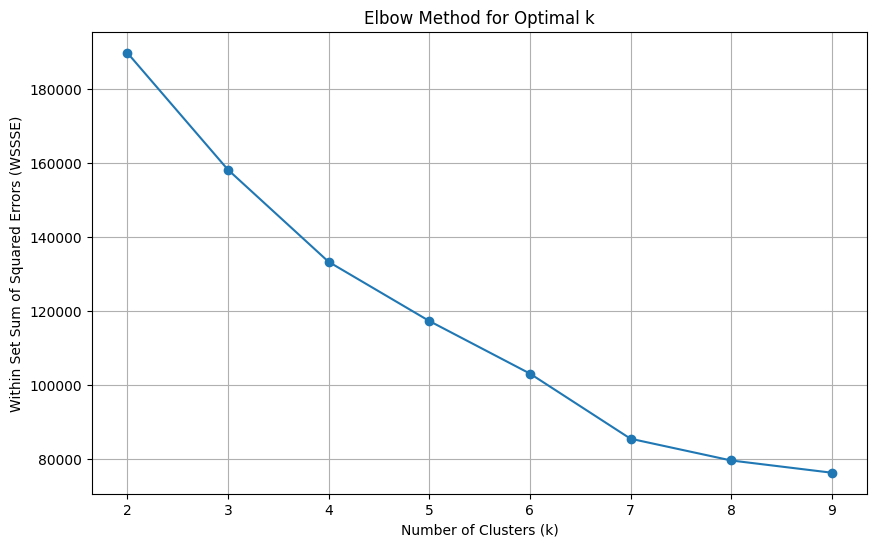

In [ ]:
from pyspark.ml.clustering import KMeans
import matplotlib.pyplot as plt

# Evaluate clustering by computing Within Set Sum of Squared Errors (WSSSE) for different k
wssse_values = []
k_range = range(2, 10) # Test k from 2 to 9

for k_val in k_range:
    kmeans = KMeans(featuresCol='features', k=k_val, seed=42)
    model = kmeans.fit(spark_dataframe_scaled)
    wssse = model.summary.trainingCost # WSSSE is available as trainingCost
    wssse_values.append(wssse)
    print(f"For k={k_val}, WSSSE = {wssse}")

# Plot the Elbow Method graph
fig = plt.figure(figsize=(10, 6))
plt.plot(k_range, wssse_values, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within Set Sum of Squared Errors (WSSSE)')
plt.title('Elbow Method for Optimal k')
plt.xticks(list(k_range))
plt.grid(True)
plt.show()


For k=2, Silhouette Score = 0.410923379736549
For k=3, Silhouette Score = 0.3346154966403306
For k=4, Silhouette Score = 0.3445864382799148
For k=5, Silhouette Score = 0.4088131984474527
For k=6, Silhouette Score = 0.4224287861750436
For k=7, Silhouette Score = 0.474438932755217
For k=8, Silhouette Score = 0.48662359213140877
For k=9, Silhouette Score = 0.4698123967304491


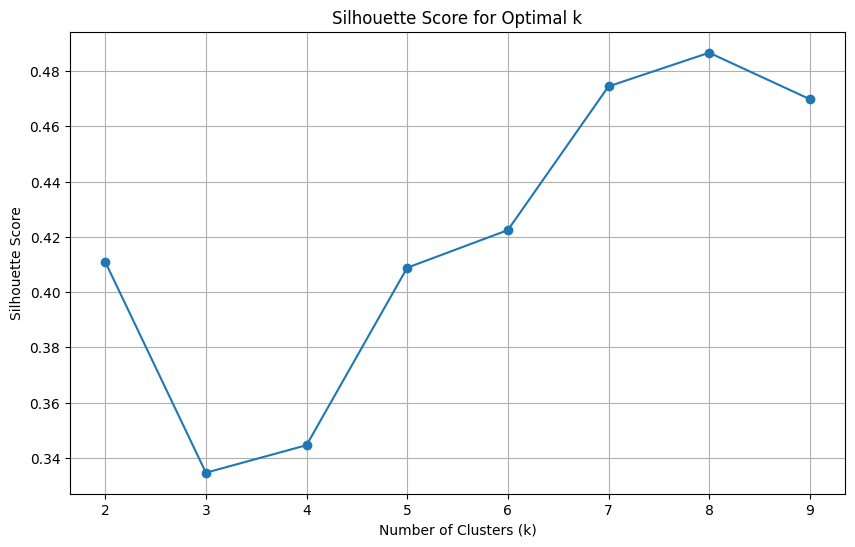

In [ ]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
import matplotlib.pyplot as plt

# Initialize a ClusteringEvaluator to compute Silhouette score
evaluator = ClusteringEvaluator(featuresCol='features', metricName='silhouette', distanceMeasure='squaredEuclidean')

silhouette_scores = []
k_range = range(2, 10) # Test k from 2 to 9

for k_val in k_range:
    kmeans = KMeans(featuresCol='features', k=k_val, seed=42)
    model = kmeans.fit(spark_dataframe_scaled)
    predictions = model.transform(spark_dataframe_scaled)

    # Evaluate clustering by computing Silhouette score
    silhouette = evaluator.evaluate(predictions)
    silhouette_scores.append(silhouette)
    print(f"For k={k_val}, Silhouette Score = {silhouette}")

# Plot the Silhouette Score graph
fig = plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.xticks(list(k_range))
plt.grid(True)
plt.show()


In [ ]:
from pyspark.ml.feature import VectorAssembler, StandardScaler

# Convert the winsorized pandas DataFrame back to a Spark DataFrame
# Make sure to drop the 'dominant_vibration_axis' column if it's not needed for clustering
spark_dataframe_prepared = spark.createDataFrame(pandas_df_winsorized.drop(columns=['dominant_vibration_axis']))

# 1. Vectorization: Assemble feature columns into a single vector column
feature_columns = ['vibration_x', 'vibration_y', 'vibration_z']
assembler = VectorAssembler(inputCols=feature_columns, outputCol='unscaled_features')
spark_dataframe_vectorized = assembler.transform(spark_dataframe_prepared)

# 2. Scaling: Scale the features using StandardScaler
scaler = StandardScaler(inputCol='unscaled_features', outputCol='features', withMean=True, withStd=True)
scaler_model = scaler.fit(spark_dataframe_vectorized)
spark_dataframe_scaled = scaler_model.transform(spark_dataframe_vectorized)

print('Schema of the prepared Spark DataFrame:')
spark_dataframe_scaled.printSchema()

print('\nFirst 5 rows of the prepared Spark DataFrame (with unscaled and scaled features):')
spark_dataframe_scaled.select('vibration_x', 'vibration_y', 'vibration_z', 'unscaled_features', 'features').show(5, truncate=False)


Schema of the prepared Spark DataFrame:
root
 |-- vibration_x: double (nullable = true)
 |-- vibration_y: double (nullable = true)
 |-- vibration_z: double (nullable = true)
 |-- unscaled_features: vector (nullable = true)
 |-- features: vector (nullable = true)


First 5 rows of the prepared Spark DataFrame (with unscaled and scaled features):
+-----------+-----------+-----------+-------------------+----------------------------------------------------------------+
|vibration_x|vibration_y|vibration_z|unscaled_features  |features                                                        |
+-----------+-----------+-----------+-------------------+----------------------------------------------------------------+
|37.0       |19.0       |-1020.0    |[37.0,19.0,-1020.0]|[0.05336464796816281,0.0030238667090110743,0.001766697526447383]|
|13.0       |5.0        |-1020.0    |[13.0,5.0,-1020.0] |[0.003016149935770934,-0.07278089215717182,0.001766697526447383]|
|31.0       |21.0       |-1013.0    |[

In [ ]:
from pyspark.ml.clustering import KMeans

k = 8 # Optimal number of clusters identified by Silhouette Score

# Initialize KMeans model
kmeans = KMeans(featuresCol='features', k=k, seed=42)

# Train the KMeans model on the scaled data
kmeans_model = kmeans.fit(spark_dataframe_scaled)

# Make predictions (assign each data point to a cluster)
clustered_spark_dataframe = kmeans_model.transform(spark_dataframe_scaled)

print(f'KMeans model trained successfully with {k} clusters.')
print('\nFirst 5 rows of the clustered Spark DataFrame (with cluster assignments):')
clustered_spark_dataframe.select('vibration_x', 'vibration_y', 'vibration_z', 'features', 'prediction').show(5, truncate=False)

print('\nCluster Centers:')
for i, center in enumerate(kmeans_model.clusterCenters()):
    print(f'Cluster {i}: {center}')


KMeans model trained successfully with 8 clusters.

First 5 rows of the clustered Spark DataFrame (with cluster assignments):
+-----------+-----------+-----------+----------------------------------------------------------------+----------+
|vibration_x|vibration_y|vibration_z|features                                                        |prediction|
+-----------+-----------+-----------+----------------------------------------------------------------+----------+
|37.0       |19.0       |-1020.0    |[0.05336464796816281,0.0030238667090110743,0.001766697526447383]|0         |
|13.0       |5.0        |-1020.0    |[0.003016149935770934,-0.07278089215717182,0.001766697526447383]|0         |
|31.0       |21.0       |-1013.0    |[0.040777523460064836,0.01385311797560863,0.029254915365691483] |0         |
|15.0       |25.0       |-1030.0    |[0.007211858105136923,0.03551162050880374,-0.037502185101044194]|0         |
|31.0       |35.0       |-1026.0    |[0.040777523460064836,0.089657876841791

### Visualizing Clusters

In [ ]:
from pyspark.ml.linalg import VectorUDT, DenseVector
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
from pyspark.sql.functions import udf
from pyspark.sql.types import ArrayType, DoubleType
from pyspark.sql import functions as F

# Define a UDF to explicitly convert a VectorUDT to a Python list
@udf(returnType=ArrayType(DoubleType()))
def get_vector_elements(vector_col):
    if vector_col is not None:
        return vector_col.toArray().tolist()
    return None

# Convert clustered_spark_dataframe to pandas DataFrame for visualization
# First, apply the UDF to create a temporary column with the vector elements as a list
clustered_spark_dataframe_with_array = clustered_spark_dataframe.withColumn(
    "features_list", get_vector_elements(F.col("features"))
)

# Then, select individual scaled features from this new list column
pandas_clustered_df = clustered_spark_dataframe_with_array.select(
    F.col('vibration_x'),
    F.col('vibration_y'),
    F.col('vibration_z'),
    F.col('prediction'),
    F.col('features_list')[0].alias('scaled_vibration_x'), # Access 0-indexed element from the list
    F.col('features_list')[1].alias('scaled_vibration_y'), # Access 1-indexed element from the list
    F.col('features_list')[2].alias('scaled_vibration_z')  # Access 2-indexed element from the list
).toPandas()


# Prepare cluster centers for plotting (they are already scaled)
# Correctly convert each DenseVector in the list to a Python list
cluster_centers_list = [center.tolist() for center in kmeans_model.clusterCenters()]
cluster_centers_df = pd.DataFrame(cluster_centers_list, columns=['scaled_vibration_x', 'scaled_vibration_y', 'scaled_vibration_z'])
cluster_centers_df['prediction'] = cluster_centers_df.index.astype(str)


# Create a 2D scatter plot of the scaled features, colored by prediction
fig = px.scatter( # Changed to px.scatter for 2D
    pandas_clustered_df,
    x='scaled_vibration_x',
    y='scaled_vibration_y',
    color='prediction',
    title='KMeans Clusters (Scaled Features, k=8)',
    labels={
        'scaled_vibration_x': 'Scaled Vibration X',
        'scaled_vibration_y': 'Scaled Vibration Y',
        'prediction': 'Cluster'
    },
    opacity=0.7,
    height=700
)

# Add cluster centers to the plot (now 2D)
fig.add_trace(go.Scatter(
    x=cluster_centers_df['scaled_vibration_x'],
    y=cluster_centers_df['scaled_vibration_y'],
    mode='markers',
    marker=dict(
        size=10,
        color='black',
        symbol='x',
        line=dict(width=2, color='white')
    ),
    name='Cluster Centers'
))

# Removed 3D specific layout update
# fig.update_layout(scene_camera=dict(up=dict(x=0, y=0, z=1), center=dict(x=0, y=0, z=0), eye=dict(x=1.25, y=1.25, z=1.25)))
fig.show()